#DL *projekat*



##Analiza podataka




###Preuzimanje dataset-a sa kaggle.com

In [35]:
import torch
device = "cuda" if torch.cuda.is_available else "cpu"
device

'cuda'

In [36]:
from google.colab import files
files.upload()  # API key za kaggle

Saving kaggle.json to kaggle.json


{'kaggle.json': b'{"username":"petarnesic","key":"644d80b88e5ada53796c026d839604e4"}'}

In [37]:
#ubacivanje kljuca za api
import os
os.makedirs('/root/.kaggle', exist_ok=True)
!mv kaggle.json /root/.kaggle/
!chmod 600 /root/.kaggle/kaggle.json

In [38]:
!pip install kaggle

###House plant species dataset
https://www.kaggle.com/datasets/kacpergregorowicz/house-plant-species

In [39]:
!kaggle datasets download -d kacpergregorowicz/house-plant-species --path dataset

Dataset URL: https://www.kaggle.com/datasets/kacpergregorowicz/house-plant-species
License(s): CC-BY-NC-SA-4.0
house-plant-species.zip: Skipping, found more recently modified local copy (use --force to force download)


In [40]:
import requests
import zipfile
from pathlib import Path

root_path = Path("dataset/")
dataset_path = root_path / "house-plant-species"

if dataset_path.is_dir():
  print(f"Image path: {dataset_path} already exists")
else:
  print(f"Downloading the dataset from kagle")

# Unzipovanje dataseta
with zipfile.ZipFile(root_path / "house-plant-species.zip", "r") as zip_ref:
  print("Unzipping data")
  zip_ref.extractall(dataset_path)

print(dataset_path)

Image path: dataset/house-plant-species already exists
Unzipping data
dataset/house-plant-species


In [41]:
import os
dataset_path = Path("/content/dataset/house-plant-species/house_plant_species")# TODO izmena

# stampanje broja fajla u svakom direktorijumu
for dirpath, dirnames, filenames in os.walk(dataset_path):#ovo izmeni
  print(f" Number of dirs: {len(dirnames)} Number of files: {len(filenames)}")


 Number of dirs: 47 Number of files: 0
 Number of dirs: 0 Number of files: 316
 Number of dirs: 0 Number of files: 266
 Number of dirs: 0 Number of files: 240
 Number of dirs: 0 Number of files: 266
 Number of dirs: 0 Number of files: 341
 Number of dirs: 0 Number of files: 396
 Number of dirs: 0 Number of files: 547
 Number of dirs: 0 Number of files: 199
 Number of dirs: 0 Number of files: 291
 Number of dirs: 0 Number of files: 359
 Number of dirs: 0 Number of files: 400
 Number of dirs: 0 Number of files: 209
 Number of dirs: 0 Number of files: 382
 Number of dirs: 0 Number of files: 290
 Number of dirs: 0 Number of files: 385
 Number of dirs: 0 Number of files: 261
 Number of dirs: 0 Number of files: 353
 Number of dirs: 0 Number of files: 234
 Number of dirs: 0 Number of files: 189
 Number of dirs: 0 Number of files: 337
 Number of dirs: 0 Number of files: 318
 Number of dirs: 0 Number of files: 514
 Number of dirs: 0 Number of files: 455
 Number of dirs: 0 Number of files: 330
 

### Pocetna analiza dataset-a
Prolaz kroz dataset i sanity check download-a
1. Ispitivanje random shape-ova
2. Prikaz random sample-ova


Jpgs list in test Aloe Vera folder [PosixPath('/content/dataset/house-plant-species/house_plant_species/Aloe Vera/104.jpg'), PosixPath('/content/dataset/house-plant-species/house_plant_species/Aloe Vera/36.jpg'), PosixPath('/content/dataset/house-plant-species/house_plant_species/Aloe Vera/12.jpg'), PosixPath('/content/dataset/house-plant-species/house_plant_species/Aloe Vera/45.jpg'), PosixPath('/content/dataset/house-plant-species/house_plant_species/Aloe Vera/58.jpg'), PosixPath('/content/dataset/house-plant-species/house_plant_species/Aloe Vera/221.jpg'), PosixPath('/content/dataset/house-plant-species/house_plant_species/Aloe Vera/191.jpg'), PosixPath('/content/dataset/house-plant-species/house_plant_species/Aloe Vera/159.jpg'), PosixPath('/content/dataset/house-plant-species/house_plant_species/Aloe Vera/95.jpg'), PosixPath('/content/dataset/house-plant-species/house_plant_species/Aloe Vera/47.jpg'), PosixPath('/content/dataset/house-plant-species/house_plant_species/Aloe Vera/20

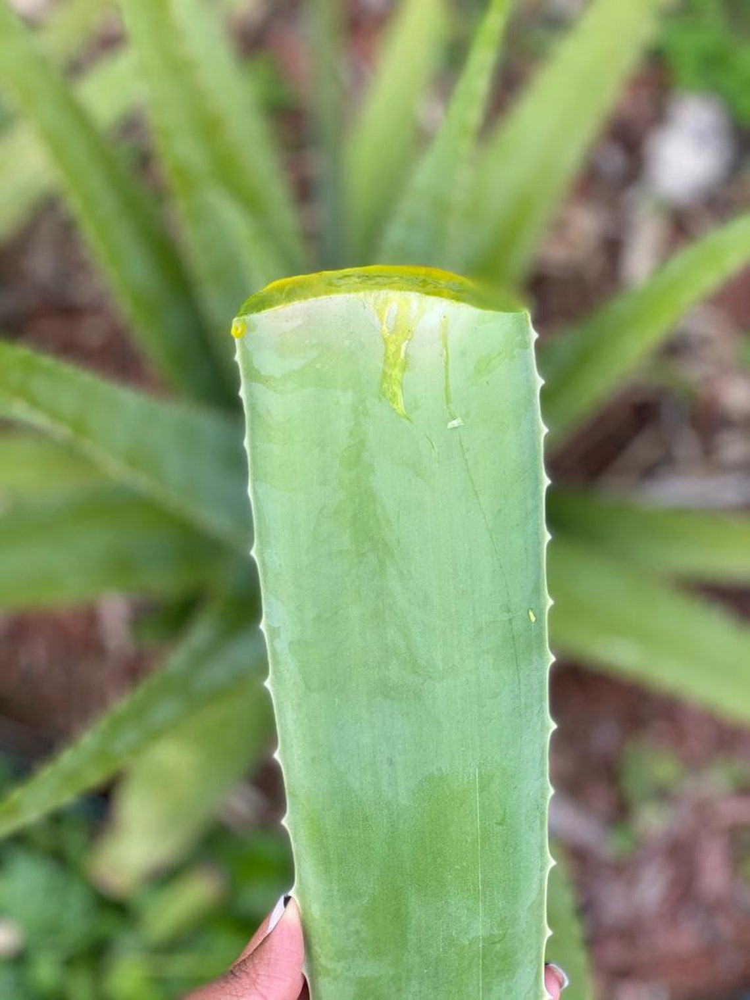

In [42]:
import random
from PIL import Image
test_images = dataset_path / "Aloe Vera"
test_images_list = list(test_images.glob("*.jpg"))

print(f"Jpgs list in test Aloe Vera folder {test_images_list}")
print(f"Len of Aloe Vera jgps folder {len(test_images_list)}")

random_image_path = random.choice(test_images_list)
print(f"Random image path {random_image_path}")

random_image_class = random_image_path.stem
print(f"Label of random image {random_image_class}")

img = Image.open(random_image_path)
print(f"Height: {img.height}")
print(f"Width: {img.width}")
img

##Transformacija i prikaz originalne verzije
1. Transformacija (128x128) je dovoljno veliko da se kvalitet boja ne izgubi
2. Plotovanje razlike izmedju originala i transformacije da bi se utvrdila adekvatna velicina transformacije

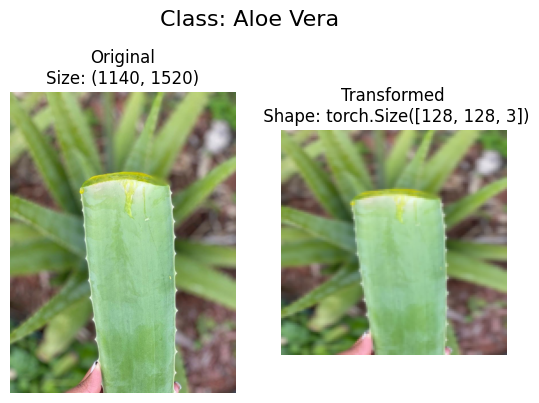

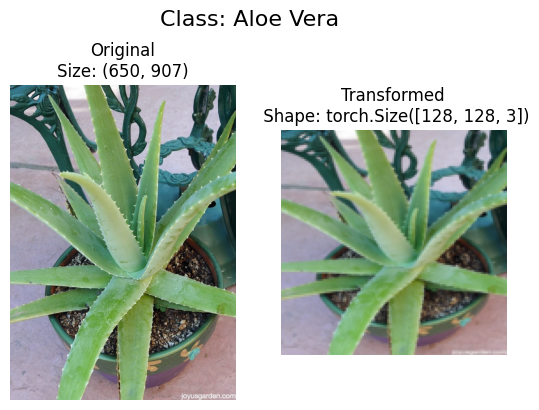

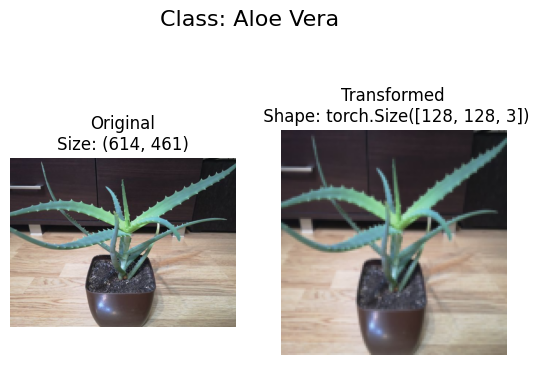

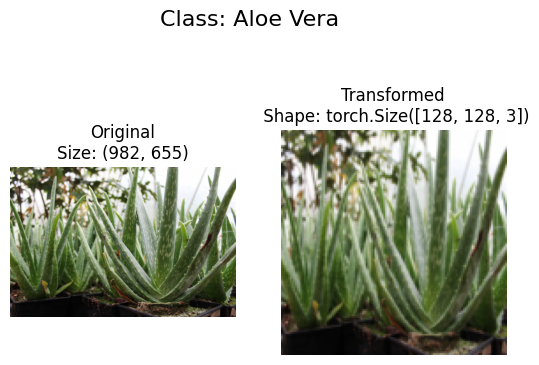

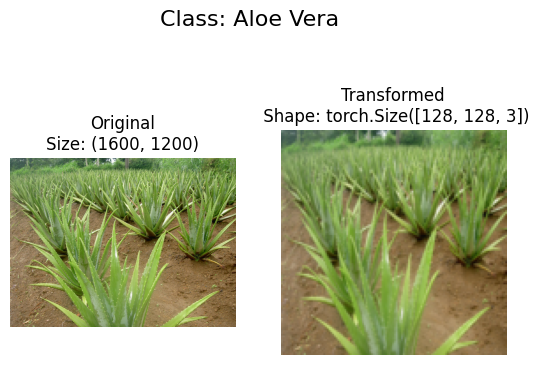

In [43]:
import torch
from torchvision import datasets, transforms
from torch.utils.data import random_split, DataLoader
import matplotlib.pyplot as plt

transform = transforms.Compose([
    transforms.Resize(size=(128,128)),
    #transforms.RandomHorizontalFlip(p=0.5), nema potrebe posto radimo sa bojama
    transforms.ToTensor(),
])
#plotovanje originala i transofrmisanog
def plot_transformed_images(image_paths, transform, n=3, seed=42):
  if seed:
    random.seed(seed)

  random_image_paths = random.sample(image_paths, k=n)
  for image_path in random_image_paths:
    with Image.open(image_path) as f:
      fig, ax = plt.subplots(nrows=1, ncols=2)
      ax[0].imshow(f)
      ax[0].set_title(f"Original\nSize: {f.size}")
      ax[0].axis(False)

      #chw -> hwc
      transformed_image = transform(f).permute(dims=(1,2,0))
      ax[1].imshow(transformed_image)
      ax[1].set_title(f"Transformed\n Shape: {transformed_image.shape}")
      ax[1].axis("off")

      fig.suptitle(f"Class: {image_path.parent.stem}", fontsize=16)

plot_transformed_images(image_paths=test_images_list,
                        transform=transform,
                        n=5,
                        seed=42)

##Train Test Split
Posto nam resavamo problem prepoznavanja dominantne boje originalni label-i nam ne vrse posao. Zato mozemo da uzmemo random subset naseg dataset-a i podelimo na train i test. Ovde je poenta da vidimo da li mozemo sa **minimalnim brojem slika** istreniramo model. U pocetku sam izabrao 1000 kao ukupan broj. Ali je model bolje radio sa vecim brojem slika pa sam stavio 4000 slika train (3200) test (800).


In [44]:
from torch.utils.data import Subset

dataset = datasets.ImageFolder(root=dataset_path, transform=transform)

print(f"Num classes {len(dataset.classes)}")
print(f"Shape CHW :{dataset[0][0].shape}")
print(f"Dataset len: {len(dataset)}")

# Biramo random n slika
subset_size = 4000
random.seed(42)
subset_indices = random.sample(range(len(dataset)), subset_size)

dataset = Subset(dataset, subset_indices)
print(f"Subset length: {len(dataset)}")

Num classes 47
Shape CHW :torch.Size([3, 128, 128])
Dataset len: 14774
Subset length: 4000


In [45]:
train_size = int(0.8 * len(dataset))
test_size = len(dataset) - train_size

# 80/20 split
train_dataset, test_dataset = random_split(dataset, [train_size, test_size])
print(f"train dataset: {len(train_dataset)} test dataset: {len(test_dataset)}")

train dataset: 3200 test dataset: 800


##Relabelovanje podataka
Da bi imali dataset iz kog cnn moze da uci potrebne su nam dominantne boje u (RGB) formatu za svaku sliku u nasem dataset-u.

### Pesacki algoritam za dobijanje dominantne boje
U pocetku sam mislio da mogu da dobijem dominantnu boju tako sto prolazim kroz listu piksela i izaberem boju koja se najvise pojavljuje.

In [46]:
from PIL import Image
import torch
from torchvision.transforms import ToPILImage
from torch.utils.data import Dataset
from collections import Counter

def get_dominant_color_pillow(image_tensor):
    to_pil = ToPILImage()
    image = to_pil(image_tensor)

    image = image.convert("RGB")

    pixels = list(image.getdata())

    color_counts = Counter(pixels)

    dominant_color = color_counts.most_common(1)[0][0]  # RGB value of the most common color
    return dominant_color

class DominantColorDataset(Dataset):
    def __init__(self, dataset):
        self.dataset = dataset
        self.new_labels = []
        self.images = []

        for idx, (image_tensor, _) in enumerate(dataset):
            image_tensor = image_tensor
            dominant_color = get_dominant_color_pillow(image_tensor)
            print(f"image {idx} dominant color: {dominant_color}")
            self.images.append(image_tensor)
            self.new_labels.append(dominant_color)

    def __len__(self):
        return len(self.dataset)

    def __getitem__(self, idx):
        image = self.images[idx]
        label = self.new_labels[idx]
        return image, label

    def get_label(self, idx):
      return self.new_labels[idx]

test_dataset = DominantColorDataset(test_dataset)
train_dataset = DominantColorDataset(train_dataset)

image 0 dominant color: (214, 230, 245)
image 1 dominant color: (255, 255, 255)
image 2 dominant color: (120, 116, 117)
image 3 dominant color: (255, 255, 255)
image 4 dominant color: (4, 4, 4)
image 5 dominant color: (254, 254, 254)
image 6 dominant color: (1, 1, 1)
image 7 dominant color: (243, 236, 230)
image 8 dominant color: (240, 244, 243)
image 9 dominant color: (18, 19, 13)
image 10 dominant color: (232, 228, 227)
image 11 dominant color: (105, 95, 93)
image 12 dominant color: (2, 2, 1)
image 13 dominant color: (245, 246, 251)
image 14 dominant color: (252, 129, 7)
image 15 dominant color: (254, 63, 157)
image 16 dominant color: (42, 15, 6)
image 17 dominant color: (36, 55, 35)
image 18 dominant color: (255, 255, 255)
image 19 dominant color: (2, 2, 4)
image 20 dominant color: (199, 199, 199)
image 21 dominant color: (176, 172, 169)
image 22 dominant color: (251, 249, 236)
image 23 dominant color: (255, 255, 255)
image 24 dominant color: (238, 238, 238)
image 25 dominant color:

/usr/local/lib/python3.10/dist-packages/PIL/Image.py:1054: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


image 149 dominant color: (255, 255, 255)
image 150 dominant color: (5, 4, 0)
image 151 dominant color: (255, 255, 255)
image 152 dominant color: (71, 75, 76)
image 153 dominant color: (234, 224, 215)
image 154 dominant color: (71, 112, 76)
image 155 dominant color: (76, 55, 41)
image 156 dominant color: (221, 220, 215)
image 157 dominant color: (219, 217, 222)
image 158 dominant color: (203, 202, 200)
image 159 dominant color: (7, 2, 2)
image 160 dominant color: (254, 254, 254)
image 161 dominant color: (255, 255, 255)
image 162 dominant color: (255, 255, 255)
image 163 dominant color: (46, 45, 54)
image 164 dominant color: (7, 5, 8)
image 165 dominant color: (148, 138, 136)
image 166 dominant color: (1, 1, 1)
image 167 dominant color: (246, 246, 244)
image 168 dominant color: (250, 247, 240)
image 169 dominant color: (255, 255, 255)
image 170 dominant color: (0, 0, 0)
image 171 dominant color: (220, 194, 161)
image 172 dominant color: (238, 239, 243)
image 173 dominant color: (3, 4, 

(25, 62, 45)


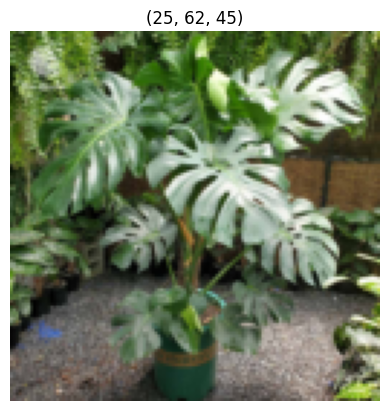

In [47]:
def view_image(image_tensor, label, dominant_color):
  to_pil = ToPILImage()
  image = to_pil(image_tensor)
  image.show()
  plt.imshow(image)
  plt.axis('off')
  plt.title(dominant_color)
  plt.show()


def save_image(image_tensor, filename):
  to_pil = ToPILImage()
  image = to_pil(image_tensor)
  image.save(filename)

image_idx = 45

image_tensor, label = train_dataset[image_idx]

dominant_color = train_dataset.get_label(image_idx)
print(dominant_color)
view_image(image_tensor, label, dominant_color)
save_image(image_tensor, "image_0.jpg")


###Color thief
Kada sam dobio rezultate od svog pesackog algoritma, morao sam nekako da proverim da li se zaista dobijaju zadovoljavajuce dominatne boje.
Guglanjem sam dosao do biblioteke **colorthief** koja nudi funkcionalnost ekstraktovanja dominantne boje iz slike.
Time sam dobio sledeci eksperiment.
Utvrdio sam da pesacki algoritam nije ni priblizno najbolje resenje tako sto sam plotovao razliku izmedju mog i color thief resenja.

In [48]:
!pip install colorthief

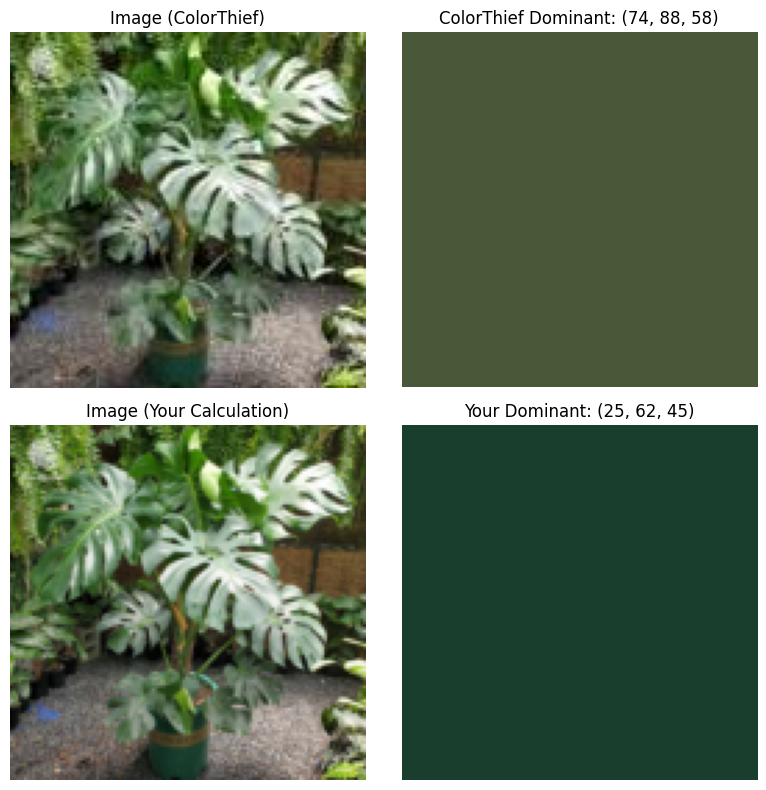

In [49]:
import matplotlib.pyplot as plt
from PIL import Image
from colorthief import ColorThief

def plot_dominant_colors(image_path, image_tensor, dominant_color):
    color_thief = ColorThief(image_path)
    dominant_color_thief = color_thief.get_color(quality=1)

    image = Image.open(image_path)

    img_tensor_plot = image_tensor.permute(1, 2, 0).numpy()

    plt.figure(figsize=(8, 8))

    plt.subplot(2, 2, 1)
    plt.imshow(image)
    plt.axis('off')
    plt.title('Image (ColorThief)')

    plt.subplot(2, 2, 2)
    plt.imshow([[dominant_color_thief]])
    plt.axis('off')
    plt.title(f'ColorThief Dominant: {dominant_color_thief}')

    plt.subplot(2, 2, 3)
    plt.imshow(img_tensor_plot)
    plt.axis('off')
    plt.title('Calculation)')

    plt.subplot(2, 2, 4)
    plt.imshow([[dominant_color]])
    plt.axis('off')
    plt.title(f'New Dominant: {dominant_color}')

    plt.tight_layout()
    plt.show()

dominant_color = train_dataset.get_label(image_idx)
plot_dominant_colors("/content/image_0.jpg", image_tensor, dominant_color)


###ColorThief Dataset
Sledeci logicki korak je bio da napravim dataset koji ce implemntiranje dobijanje dominantne boje preko colorthief biblioteke. Sto se pokazalo kao najbolje resenje

In [50]:
from PIL import Image
import torch
from torchvision.transforms import ToPILImage
from torch.utils.data import Dataset
from colorthief import ColorThief
import os
import tempfile

class DominantColorDatasetWithColorThief(Dataset):
    def __init__(self, dataset):
        self.dataset = dataset
        self.new_labels = []
        self.images = []

        self.temp_dir = tempfile.TemporaryDirectory()

        for idx, (image_tensor, _) in enumerate(dataset):
            image_path = self._save_tensor_as_image(image_tensor, idx)

            color_thief = ColorThief(image_path)
            dominant_color = color_thief.get_color(quality=1)

            print(f"Image {idx} dominant color: {dominant_color}")

            self.images.append(image_tensor)
            self.new_labels.append(dominant_color)

    def __len__(self):
        return len(self.dataset)

    def __getitem__(self, idx):
        image = self.images[idx]
        label = self.new_labels[idx]
        return image, label

    def get_label(self, idx):
        return self.new_labels[idx]

    def _save_tensor_as_image(self, image_tensor, idx):
        to_pil = ToPILImage()
        image = to_pil(image_tensor)

        image_path = os.path.join(self.temp_dir.name, f"image_{idx}.jpg")
        image.save(image_path)
        return image_path

    def cleanup(self):
        self.temp_dir.cleanup()

original_train_dataset = train_dataset
original_test_dataset = test_dataset

train_dataset = DominantColorDatasetWithColorThief(train_dataset)
test_dataset = DominantColorDatasetWithColorThief(test_dataset)

image_idx = 45
image_tensor_ct, label_ct = train_dataset[image_idx]
print(f"Label for image {image_idx}: {label_ct}")

train_dataset.cleanup()
test_dataset.cleanup()


Image 0 dominant color: (50, 50, 43)
Image 1 dominant color: (56, 66, 44)
Image 2 dominant color: (28, 63, 19)
Image 3 dominant color: (194, 167, 149)
Image 4 dominant color: (70, 114, 64)
Image 5 dominant color: (112, 75, 70)
Image 6 dominant color: (170, 166, 163)
Image 7 dominant color: (183, 167, 169)
Image 8 dominant color: (144, 129, 117)
Image 9 dominant color: (235, 227, 216)
Image 10 dominant color: (59, 69, 42)
Image 11 dominant color: (87, 112, 53)
Image 12 dominant color: (124, 145, 52)
Image 13 dominant color: (38, 44, 21)
Image 14 dominant color: (68, 64, 60)
Image 15 dominant color: (53, 58, 50)
Image 16 dominant color: (84, 103, 43)
Image 17 dominant color: (194, 185, 82)
Image 18 dominant color: (230, 225, 214)
Image 19 dominant color: (64, 42, 21)
Image 20 dominant color: (77, 64, 68)
Image 21 dominant color: (112, 94, 80)
Image 22 dominant color: (132, 162, 71)
Image 23 dominant color: (202, 199, 192)
Image 24 dominant color: (216, 208, 192)
Image 25 dominant color: 

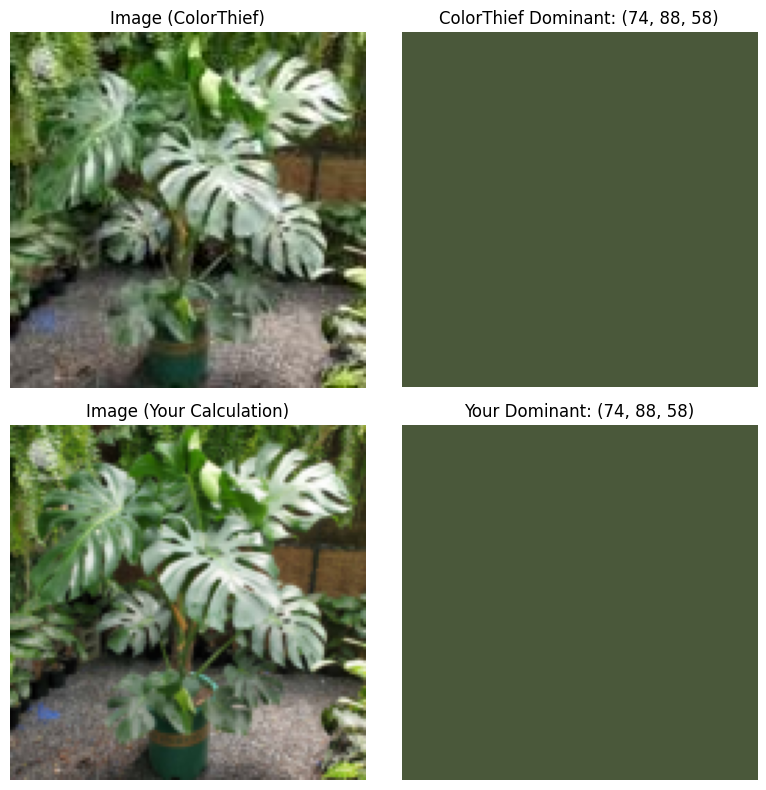

In [51]:
plot_dominant_colors("/content/image_0.jpg", image_tensor_ct, label_ct)

###Vizualizacija novog dataset-a
Ovaj plot prikazuje sliku i uglu njenu dominatnu boju tj. label.

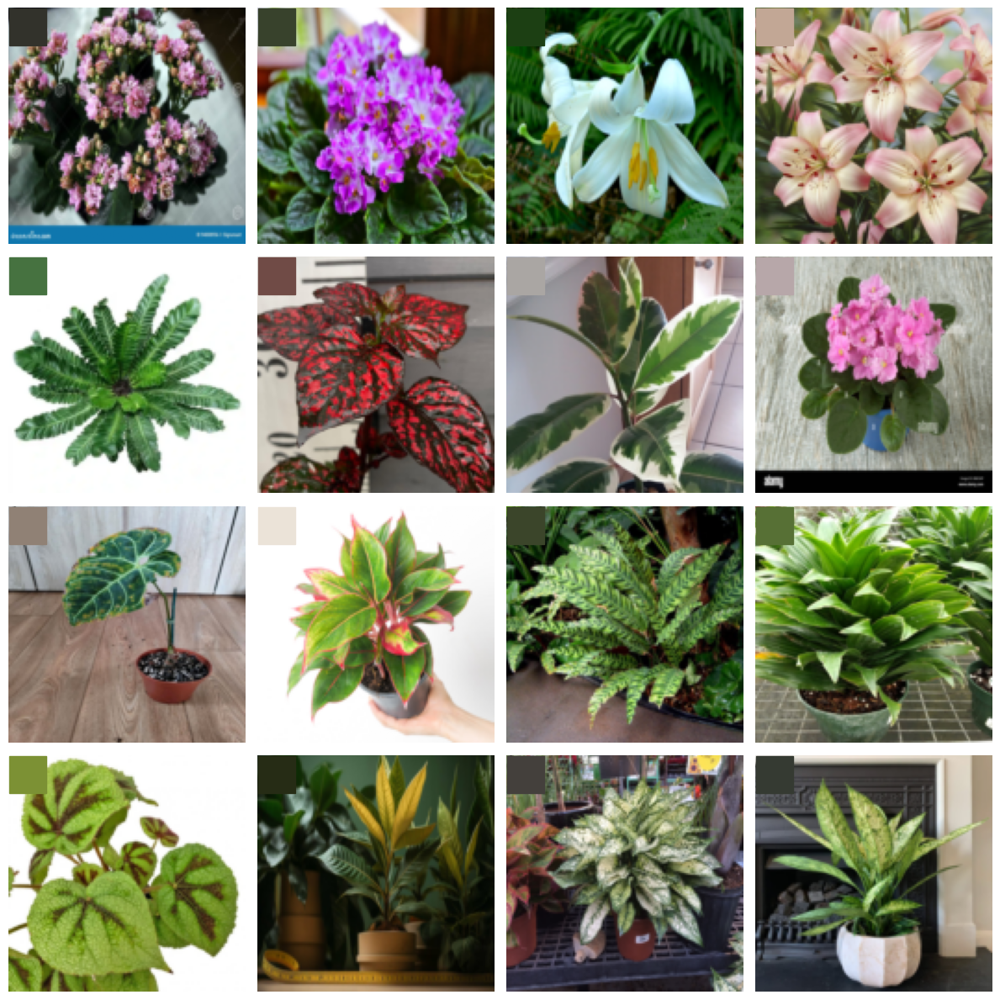

In [52]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches

def plot_images_with_colors(dataset, num_images=16):
    fig, axes = plt.subplots(4, 4, figsize=(12, 12))
    for i, ax in enumerate(axes.flat):
        if i >= num_images:
            break
        image, label = dataset[i]
        img = image.permute(1, 2, 0).numpy()
        ax.imshow(img)
        patch = patches.Rectangle((0, 0), 20, 20, color=[c/255 for c in label])
        ax.add_patch(patch)
        ax.axis('off')
    plt.tight_layout()
    plt.show()

plot_images_with_colors(train_dataset)


##Vizualizacija i analiza dataset-a


####Barchart distribucija boja

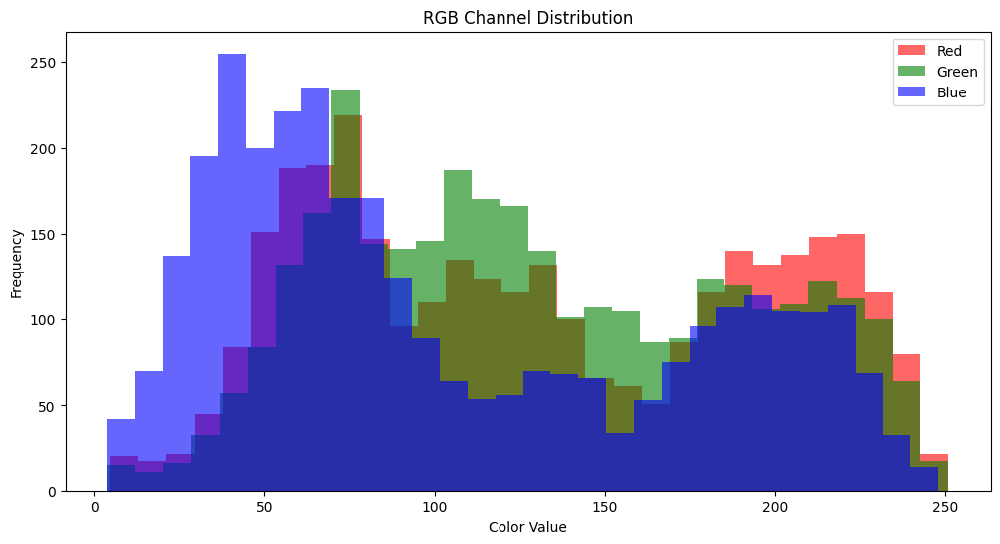

In [53]:
import numpy as np

def plot_rgb_distribution(dataset):
    r, g, b = [], [], []
    for _, label in dataset:
        r.append(label[0])
        g.append(label[1])
        b.append(label[2])

    plt.figure(figsize=(12, 6))
    plt.hist(r, bins=30, alpha=0.6, color='red', label='Red')
    plt.hist(g, bins=30, alpha=0.6, color='green', label='Green')
    plt.hist(b, bins=30, alpha=0.6, color='blue', label='Blue')
    plt.xlabel('Color Value')
    plt.ylabel('Frequency')
    plt.title('RGB Channel Distribution')
    plt.legend()
    plt.show()

# Plot RGB distribution
plot_rgb_distribution(train_dataset)

#####Zakljucak bar chartovi
Mozemo da vidimo frekvenciju boja u RGB formatu.

####Clusters

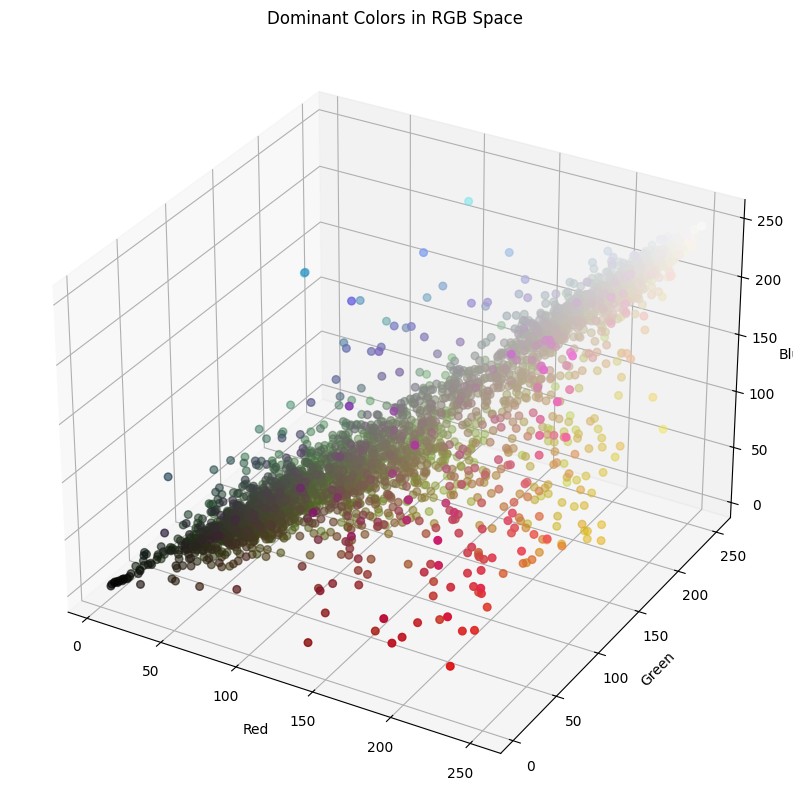

In [54]:
from mpl_toolkits.mplot3d import Axes3D

def plot_rgb_3d(dataset):
    r, g, b = [], [], []
    for _, label in dataset:
        r.append(label[0])
        g.append(label[1])
        b.append(label[2])

    fig = plt.figure(figsize=(10, 10))
    ax = fig.add_subplot(111, projection='3d')
    ax.scatter(r, g, b, c=np.array([r, g, b]).T / 255, s=30)
    ax.set_xlabel('Red')
    ax.set_ylabel('Green')
    ax.set_zlabel('Blue')
    ax.set_title('Dominant Colors in RGB Space')
    plt.show()

# Plot RGB cube
plot_rgb_3d(train_dataset)


#####Zakljucak Klasteri
Klasterovanjem podataka dobijamo siru sliku dominantih boja u train dataset-u.


####Heatmap of Color Occurence

####Brightness vs Saturation

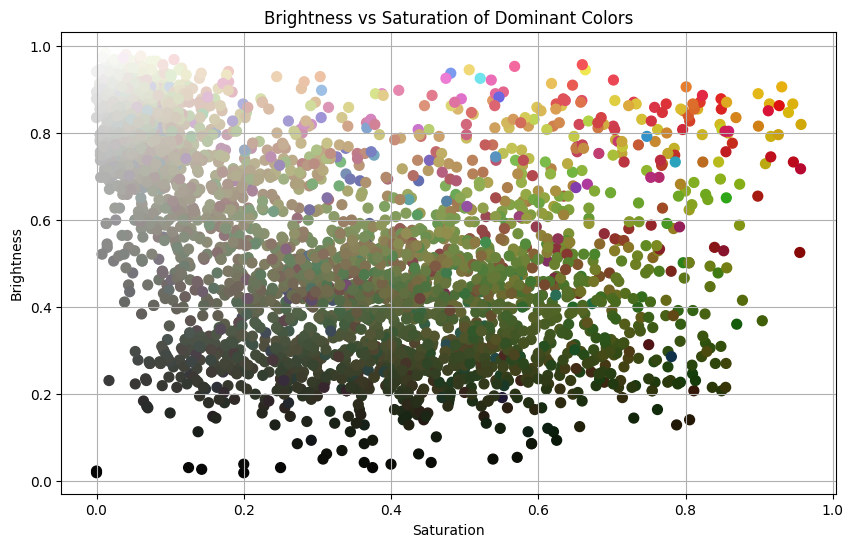

In [56]:
import colorsys
import matplotlib.pyplot as plt

def plot_brightness_vs_saturation(dataset, title="Brightness vs Saturation of Dominant Colors"):
    dominant_colors = [label for _, label in dataset]

    # Convert RGB to HSV
    hsv_colors = [colorsys.rgb_to_hsv(r / 255, g / 255, b / 255) for r, g, b in dominant_colors]
    brightness = [hsv[2] for hsv in hsv_colors]  # Extract brightness (value)
    saturation = [hsv[1] for hsv in hsv_colors]  # Extract saturation

    # Scatter plot
    plt.figure(figsize=(10, 6))
    plt.scatter(saturation, brightness, c=[f'#{int(r):02x}{int(g):02x}{int(b):02x}' for r, g, b in dominant_colors], s=50)
    plt.title(title)
    plt.xlabel("Saturation")
    plt.ylabel("Brightness")
    plt.grid(True)
    plt.show()

plot_brightness_vs_saturation(train_dataset)


#####Zakljucak Brightness vs Saturation
Zakljucak je da na celom train_dataset-u najvise dominiraju svetlije i tamnije boje dok su jarke boje obicno boje cvetova redje, ali imaju jacu saturaciju.

##Normalizovani dataset
Posto pustamo dataset kroz cnn podaci tj. boje bi trebale biti normalizovane.
```
  self.new_labels.append([x / 255.0 for x in dominant_color])
```




In [57]:
from torch.utils.data import Dataset
from torchvision.transforms import ToPILImage
from colorthief import ColorThief
import tempfile
import os
import torch

class DominantDatasetV2(Dataset):
    def __init__(self, dataset):
        self.dataset = dataset
        self.new_labels = []
        self.images = []

        self.temp_dir = tempfile.TemporaryDirectory()

        for idx, (image_tensor, _) in enumerate(dataset):
            image_tensor =image_tensor
            image_path = self._save_tensor_as_image(image_tensor, idx)

            color_thief = ColorThief(image_path)
            dominant_color = color_thief.get_color(quality=1)

            print(f"Image {idx} dominant color: {dominant_color}")

            self.images.append(image_tensor)
            self.new_labels.append([x / 255.0 for x in dominant_color])

    def __len__(self):
        return len(self.dataset)

    def __getitem__(self, idx):
        image = self.images[idx]
        label = torch.tensor(self.new_labels[idx], dtype=torch.float32)
        return image, label

    def get_label(self, idx):
        return self.new_labels[idx]

    def _save_tensor_as_image(self, image_tensor, idx):
        to_pil = ToPILImage()
        image = to_pil(image_tensor)

        image_path = os.path.join(self.temp_dir.name, f"image_{idx}.jpg")
        image.save(image_path)
        return image_path

    def cleanup(self):
        self.temp_dir.cleanup()


train_dataset = DominantDatasetV2(original_train_dataset)
test_dataset = DominantDatasetV2(original_test_dataset)
print(f"len train dataset {train_dataset}")
print(f"len test dataset {test_dataset}")
print(f"sample {train_dataset[42]}")

Image 0 dominant color: (50, 50, 43)
Image 1 dominant color: (56, 66, 44)
Image 2 dominant color: (28, 63, 19)
Image 3 dominant color: (194, 167, 149)
Image 4 dominant color: (70, 114, 64)
Image 5 dominant color: (112, 75, 70)
Image 6 dominant color: (170, 166, 163)
Image 7 dominant color: (183, 167, 169)
Image 8 dominant color: (144, 129, 117)
Image 9 dominant color: (235, 227, 216)
Image 10 dominant color: (59, 69, 42)
Image 11 dominant color: (87, 112, 53)
Image 12 dominant color: (124, 145, 52)
Image 13 dominant color: (38, 44, 21)
Image 14 dominant color: (68, 64, 60)
Image 15 dominant color: (53, 58, 50)
Image 16 dominant color: (84, 103, 43)
Image 17 dominant color: (194, 185, 82)
Image 18 dominant color: (230, 225, 214)
Image 19 dominant color: (64, 42, 21)
Image 20 dominant color: (77, 64, 68)
Image 21 dominant color: (112, 94, 80)
Image 22 dominant color: (132, 162, 71)
Image 23 dominant color: (202, 199, 192)
Image 24 dominant color: (216, 208, 192)
Image 25 dominant color: 

##Dizajniranje modela

####Base Model Tiny Vgg
Ovako je izgledao pocetni model koji sam odradio. Planirao sam da to bude bazni model koji cu dalje modifikovati pri eksperimentisanju.

* lr = 0.0001, epochs = 10, len(dataset) = 2000
 * **Epoch 10, Loss: 0.009042200832627714**
 * **Validation Accuracy (within threshold 0.2): 50.75%**

* lr = 0.001, epochs = 10, len(dataset) = 2000
 * **Epoch 10, Loss: 0.003276767379138619**
 * **Validation Accuracy (within threshold 0.2): 56.50%**

In [58]:
from tqdm.auto import tqdm

import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, Dataset
import numpy as np

class DominantColorCNNTinyVggV0(nn.Module):
  def __init__(self):

    super(DominantColorCNNTinyVggV0, self).__init__()
    self.conv_block_1 = nn.Sequential(
            nn.Conv2d(in_channels=3, out_channels=32, kernel_size=3, stride=1, padding=1),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2) # 128 -> 64
        )
    self.conv_block_2 = nn.Sequential(
          nn.Conv2d(in_channels=32, out_channels=64, kernel_size=3, stride=1, padding=1),
          nn.ReLU(),
          nn.MaxPool2d(kernel_size=2)   # 64 -> 32
        )

    self.fc1 = nn.Linear(64 * 32 * 32, 512)
    self.fc2 = nn.Linear(512, 3)

  def forward(self, x):
    x = self.conv_block_1(x)
    x = self.conv_block_2(x)
    x = x.view(x.size(0), -1)
    x = torch.relu(self.fc1(x))
    x = self.fc2(x)
    return x


def train_model(model, train_loader, criterion, optimizer, num_epochs=10):
    model.train()
    for epoch in range(num_epochs):
        running_loss = 0.0
        for images, labels in tqdm(train_loader, desc=f"Epoch {epoch+1}/{num_epochs}"):
            images, labels = images, labels

            optimizer.zero_grad()

            outputs = model(images)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()

            running_loss += loss.item()

        print(f"Epoch {epoch+1}, Loss: {running_loss / len(train_loader)}")
# device = "cuda" if torch.cuda.is_available else "cpu"
# print(f"Device {device}")

random.seed(42)
tiny_vgg_v0 = DominantColorCNNTinyVggV0()

criterion = nn.MSELoss()
optimizer = optim.Adam(tiny_vgg_v0.parameters(), lr=0.001)

train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False)

train_model(tiny_vgg_v0, train_loader,criterion, optimizer, num_epochs=10)
#   0.001
#


Epoch 1/10:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch 1, Loss: 2.0268676912225785


Epoch 2/10:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch 2, Loss: 0.03454612876288593


Epoch 3/10:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch 3, Loss: 0.03156605429016054


Epoch 4/10:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch 4, Loss: 0.02855373254045844


Epoch 5/10:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch 5, Loss: 0.023566508614458144


Epoch 6/10:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch 6, Loss: 0.018684240034781398


Epoch 7/10:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch 7, Loss: 0.013924887799657882


Epoch 8/10:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch 8, Loss: 0.009678617916069925


Epoch 9/10:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch 9, Loss: 0.006924309846945107


Epoch 10/10:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch 10, Loss: 0.005231211641803384


####Evaluacija Base Tiny Vgg

In [59]:
def evaluate_model(model, test_loader, criterion):
    model.eval()
    total_loss = 0.0

    with torch.no_grad():
        for images, labels in test_loader:
            images, labels = images, labels
            outputs = model(images)
            loss = criterion(outputs, labels)
            total_loss += loss.item()

    avg_loss = total_loss / len(test_loader)
    print(f"Validation Loss (MSE): {avg_loss}")

#posle
def evaluate_model_with_accuracy(model, test_loader, criterion, threshold=0.1):
    model.eval()
    total_loss = 0.0
    correct_predictions = 0
    total_samples = 0

    with torch.no_grad():
        for images, labels in test_loader:
            images, labels = images, labels
            outputs = model(images)

            loss = criterion(outputs, labels)
            total_loss += loss.item()

            distances = torch.norm(outputs - labels, dim=1)  # distance
            correct_predictions += torch.sum(distances < threshold).item()
            total_samples += labels.size(0)

    avg_loss = total_loss / len(test_loader)
    accuracy = (correct_predictions / total_samples) * 100
    print(f"Validation Loss (MSE): {avg_loss}")
    print(f"Validation Accuracy (within threshold {threshold}): {accuracy:.2f}%")

def visualize_predictions(model, test_loader, num_samples=10):
    model.eval()
    samples_shown = 0

    with torch.no_grad():
        for images, labels in test_loader:
            images, labels = images, labels
            outputs = model(images)

            for i in range(images.size(0)):
                if samples_shown >= num_samples:
                    return

                true_color = labels[i].numpy()
                predicted_color = outputs[i].numpy()

                plt.figure(figsize=(4, 2))

                plt.subplot(1, 2, 1)
                plt.imshow([[true_color]], extent=[0, 1, 0, 1])
                plt.title(f"True Color")
                plt.axis('off')

                plt.subplot(1, 2, 2)
                plt.imshow([[predicted_color]], extent=[0, 1, 0, 1])
                plt.title(f"Predicted Color")
                plt.axis('off')

                plt.show()
                samples_shown += 1




Validation Loss (MSE): 0.04176634728908539
Validation Accuracy (within threshold 0.2): 52.62%


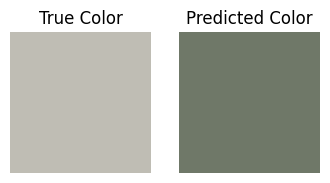

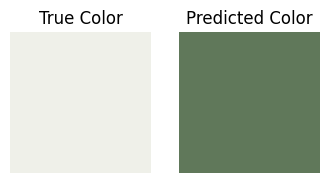

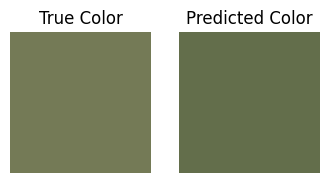

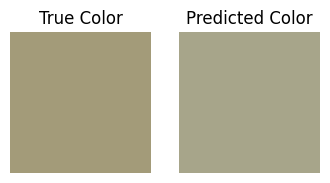

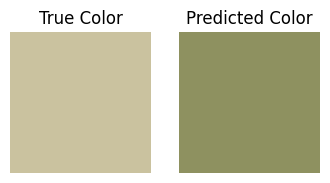

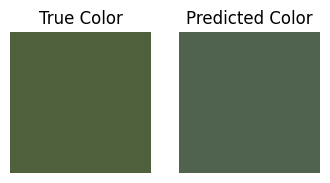

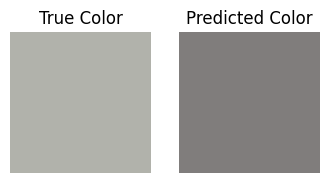

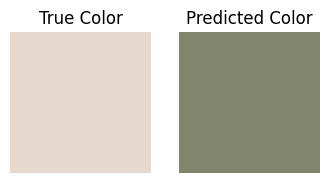

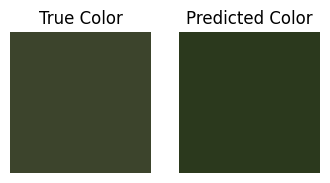

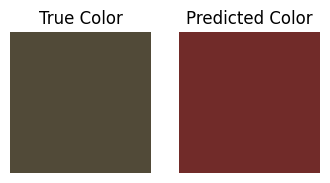

In [67]:
evaluate_model_with_accuracy(tiny_vgg_v0, test_loader, criterion, threshold=0.2)
visualize_predictions(tiny_vgg_v0, test_loader, num_samples=10)

### Optimized tiny vgg model


---


Kao prvi model sam izabrao TinyVgg CNN koji se koristi u web aplikaciji CNN explainer: https://poloclub.github.io/cnn-explainer/

**Dataset od 1000 slika (80/20 split)**
* U pocetku sam krenuo sa dva konvoluciona bloka i 5 epoha
* Dodao sam jos jedan konvolucioni blok
* Povecao broj epoha na 10 lr = 0.001:
  * **loss = 0.028901823163032532**
  * **Validation Accuracy (within threshold 0.2): 41.00%**

* Dodat dropout:
  * **Epoch 10, Loss: 0.0394578506052494**
  * **Validation Accuracy (within threshold 0.2): 40.00%**

* Smanjen lr = 0.01
  * **Epoch 10, Loss: 0.05953421503305435**
  * **Validation Accuracy (within threshold 0.2): 24.50%**
      *definitivno nije do learning rate-a*
* Povecan kernel size za prvi blok kernel_size = 5
  * **Epoch 10, Loss: 0.03888051964342594**
  * **Validation Accuracy (within threshold 0.2): 30.50%**

* Smanjen lr = 0.0001
 * **Epoch 10, Loss: 0.03394387416541576**
 * **Validation Accuracy (within threshold 0.2): 41.50%**

**Zakljucak**: *Povecaj dataset*
 * len(dataset) = 2000 lr = 0.0001, num_epochs = 10, dropout = 0.5  
  * **Epoch 10, Loss: 0.027997281588613986**
  * **Validation Accuracy (within threshold 0.2): 50.25%**

 * len(dataset) = 2000 lr = 0.001, num_epochs = 10, dropout = 0.5
    * **Epoch 10, Loss: 0.026610757261514663**
    * **Validation Accuracy (within threshold 0.2): 43.25%**
    
 * ***Zakljucak*** Koliko god se igrao sa hiperparametrima dataset duzine 1000 je previse malo da bi se model korektno istrenirao. Predikcije su znatno bolje uz povecanje dataset-a.
 Pravo pitanje koliko je moguce minimalno povecati dataset a da predikcije budu zadovoljavajuce


In [61]:
from tqdm.auto import tqdm

import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, Dataset
import numpy as np


class DominantColorCNNTinyVgg(nn.Module):
  def __init__(self):

    super(DominantColorCNNTinyVgg, self).__init__()
    self.conv_block_1 = nn.Sequential(
            nn.Conv2d(in_channels=3, out_channels=32, kernel_size=3, stride=1, padding=1),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2)  # 128 -> 64
        )

    self.conv_block_2 = nn.Sequential(
          nn.Conv2d(in_channels=32, out_channels=64, kernel_size=3, stride=1, padding=1),
          nn.ReLU(),
          nn.MaxPool2d(kernel_size=2)
        )
    # naknadno dodavanje jos jednog bloka
    self.conv_block_3 = nn.Sequential(
            nn.Conv2d(64, 128, kernel_size=3, stride=1, padding=1),
            nn.ReLU(),
            nn.MaxPool2d(2)
        )

    self.fc1 = nn.Sequential(
        nn.Linear(128 * 16 * 16, 1024),
        nn.ReLU(),
        nn.Dropout(0.5))

    self.fc2 = nn.Sequential(
        nn.Linear(1024, 512),
        nn.ReLU(),
        nn.Dropout(0.5))

    self.fc3 = nn.Linear(512, 3)


  def forward(self, x):
    x = self.conv_block_1(x)  # Pass through first block
    x = self.conv_block_2(x)
    x = self.conv_block_3(x)
    x = x.view(x.size(0), -1)
    x = self.fc1(x)
    x = self.fc2(x)
    x = self.fc3(x)
    return x

def train_model(model, train_loader, criterion, optimizer, num_epochs=10):
    model.train()
    for epoch in range(num_epochs):
        running_loss = 0.0
        for images, labels in tqdm(train_loader, desc=f"Epoch {epoch+1}/{num_epochs}"):
            images, labels = images, labels

            optimizer.zero_grad()

            outputs = model(images)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()

            running_loss += loss.item()

        print(f"Epoch {epoch+1}, Loss: {running_loss / len(train_loader)}")
# device = "cuda" if torch.cuda.is_available else "cpu"
# print(f"Device {device}")

random.seed(42)
tiny_vgg = DominantColorCNNTinyVgg()

criterion = nn.MSELoss()
optimizer = optim.Adam(tiny_vgg.parameters(), lr=0.001)

train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False)

train_model(tiny_vgg, train_loader,criterion, optimizer, num_epochs=10)

Epoch 1/10:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch 1, Loss: 0.11754198743030429


Epoch 2/10:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch 2, Loss: 0.049537167362868784


Epoch 3/10:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch 3, Loss: 0.04761195626109838


Epoch 4/10:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch 4, Loss: 0.04248152900487184


Epoch 5/10:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch 5, Loss: 0.04028931898996234


Epoch 6/10:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch 6, Loss: 0.03635323327034712


Epoch 7/10:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch 7, Loss: 0.03519321568310261


Epoch 8/10:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch 8, Loss: 0.03470240596681833


Epoch 9/10:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch 9, Loss: 0.03290440309792757


Epoch 10/10:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch 10, Loss: 0.027988639818504454


####Evaluacija Optimizovanog Tiny Vgg-a

---

1. Evaluacija modela na osnovu funkcije trosku
2. Evaluacija modela na osnovu preciznosti predikcije
3. Plotovanje originalne i predvidjene dominantne boje

Validation Loss (MSE): 0.0360040769726038
Validation Accuracy (within threshold 0.2): 50.62%


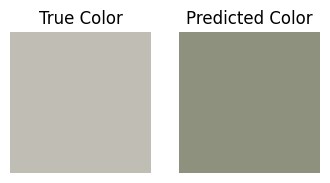

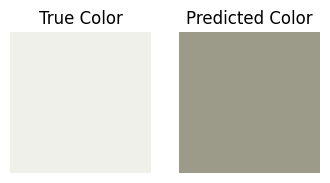

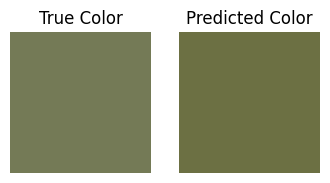

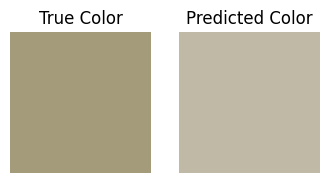

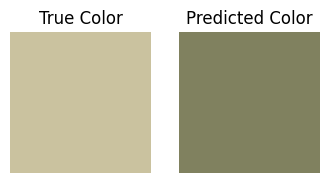

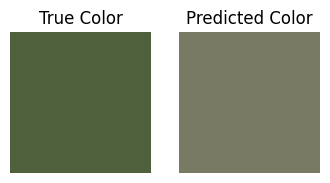

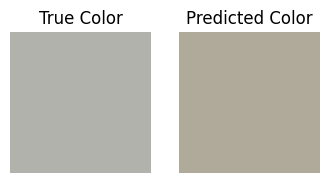

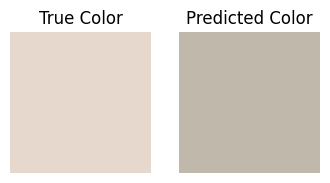

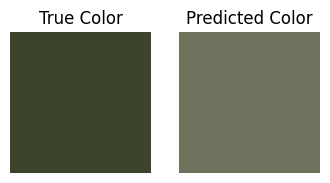

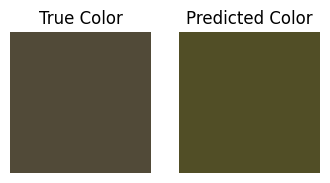

In [68]:
evaluate_model_with_accuracy(tiny_vgg, test_loader, criterion, threshold=0.2)
visualize_predictions(tiny_vgg, test_loader, num_samples=10)


### Drugi model

1. Dizajniranje modela
2. Testiranje
3. Vizualizacija

* dataset od 1000 i dataset od 4000
* mali broj epoha (5) lr=0.1
* veci broj epoha (10) manji lr = 0.01

lr = 0.0001 len(dataset) = 2000
**Validation Accuracy (within threshold 0.2): 48.00%**


In [63]:
import torch
import torch.nn as nn
import torch.optim as optim
import torch.utils.data as data
from torch.utils.data import DataLoader
from tqdm.auto import tqdm
import matplotlib.pyplot as plt


class DominantColorCNN(nn.Module):
    def __init__(self):
        super(DominantColorCNN, self).__init__()
        self.conv1 = nn.Conv2d(in_channels=3, out_channels=32, kernel_size=3, stride=1, padding=1)
        self.conv2 = nn.Conv2d(32, 64, kernel_size=3, stride=1, padding=1)
        self.conv3 = nn.Conv2d(64, 128, kernel_size=3, stride=1, padding=1)
        self.conv4 = nn.Conv2d(128, 256, kernel_size=3, stride=1, padding=1)

        self.fc1 = nn.Linear(256 * 8 * 8, 512)
        self.fc2 = nn.Linear(512, 3)

    def forward(self, x):
        x = torch.relu(self.conv1(x))
        x = torch.max_pool2d(x, 2)
        x = torch.relu(self.conv2(x))
        x = torch.max_pool2d(x, 2)
        x = torch.relu(self.conv3(x))
        x = torch.max_pool2d(x, 2)
        x = torch.relu(self.conv4(x))
        x = torch.max_pool2d(x, 2)

        x = x.view(x.size(0), -1)
        x = torch.relu(self.fc1(x))
        x = self.fc2(x)
        return x



device = torch.device("cuda" if torch.cuda.is_available else "cpu")
print(f"device: {device}")
print(type(train_dataset))
print(type(test_dataset))
train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False)

model = DominantColorCNN()
criterion = nn.MSELoss()
optimizer = optim.Adam(model.parameters(), lr=0.0001)

train_model(model, train_loader, criterion, optimizer, num_epochs=10)


device: cuda
<class '__main__.DominantDatasetV2'>
<class '__main__.DominantDatasetV2'>


Epoch 1/10:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch 1, Loss: 0.051335390266031025


Epoch 2/10:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch 2, Loss: 0.03484281623736024


Epoch 3/10:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch 3, Loss: 0.03468580861575901


Epoch 4/10:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch 4, Loss: 0.033192104380577805


Epoch 5/10:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch 5, Loss: 0.029642951525747776


Epoch 6/10:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch 6, Loss: 0.030110664078965784


Epoch 7/10:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch 7, Loss: 0.028258475065231322


Epoch 8/10:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch 8, Loss: 0.026671662796288728


Epoch 9/10:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch 9, Loss: 0.02610411189496517


Epoch 10/10:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch 10, Loss: 0.025163433831185102


####Vizualizacija resenja


Validation Loss (MSE): 0.03562649182975292
Validation Accuracy (within threshold 0.2): 52.88%


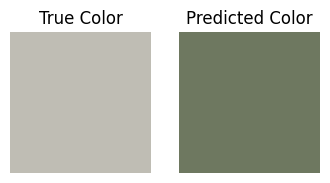

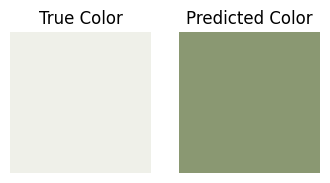

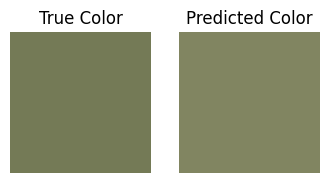

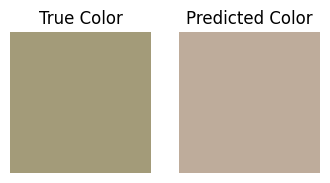

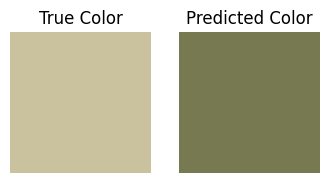

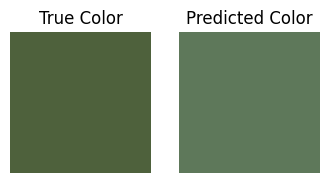

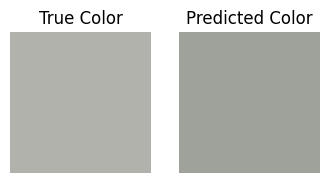

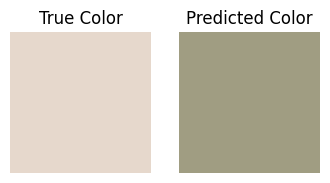

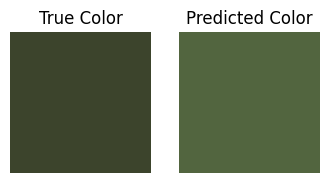

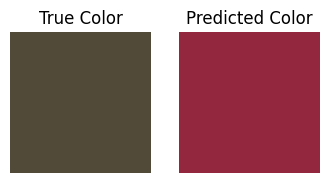

In [70]:
evaluate_model_with_accuracy(model, test_loader, criterion, threshold=0.2)
visualize_predictions(model, test_loader, num_samples=10)


#povecaj broj epoha za pocetak
#smanji lr
#vec mnogo bolje
#povecaj dataset sa 1000 na 2000
#povecaj dataset na 4000
#mse -> reduction none

####Optimizovani model

In [65]:
import torch
import torch.nn as nn
import torch.nn.functional as F

class OptimizedDominantColorCNN(nn.Module):
    def __init__(self):
        super(OptimizedDominantColorCNN, self).__init__()
        self.conv1 = nn.Sequential(
            nn.Conv2d(3, 32, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(32),
            nn.ReLU()
        )
        self.conv2 = nn.Sequential(
            nn.Conv2d(32, 64, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU()
        )
        self.conv3 = nn.Sequential(
            nn.Conv2d(64, 128, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU()
        )
        self.conv4 = nn.Sequential(
            nn.Conv2d(128, 256, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(256),
            nn.ReLU()
        )

        self.pool = nn.MaxPool2d(2)

        self.gap = nn.AdaptiveAvgPool2d(1)

        self.fc1 = nn.Linear(256, 128)
        self.fc2 = nn.Linear(128, 3)

    def forward(self, x):
        x = self.pool(self.conv1(x))
        x = self.pool(self.conv2(x))
        x = self.pool(self.conv3(x))
        x = self.pool(self.conv4(x))

        x = self.gap(x)
        x = torch.flatten(x, 1)

        x = F.relu(self.fc1(x))
        x = self.fc2(x)
        return x


device = torch.device("cuda" if torch.cuda.is_available else "cpu")
print(f"device: {device}")

print(type(train_dataset))
print(type(test_dataset))

train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False)

opt_model = DominantColorCNN()
criterion = nn.MSELoss()
optimizer = optim.Adam(opt_model.parameters(), lr=0.0001)

train_model(opt_model, train_loader, criterion, optimizer, num_epochs=10)


device: cuda
<class '__main__.DominantDatasetV2'>
<class '__main__.DominantDatasetV2'>


Epoch 1/10:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch 1, Loss: 0.057699831314384935


Epoch 2/10:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch 2, Loss: 0.0361374800093472


Epoch 3/10:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch 3, Loss: 0.03263624992221594


Epoch 4/10:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch 4, Loss: 0.030814564004540444


Epoch 5/10:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch 5, Loss: 0.02920246109366417


Epoch 6/10:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch 6, Loss: 0.029229511050507428


Epoch 7/10:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch 7, Loss: 0.028563155364245175


Epoch 8/10:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch 8, Loss: 0.028353310460224747


Epoch 9/10:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch 9, Loss: 0.025929388841614127


Epoch 10/10:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch 10, Loss: 0.028184109814465046


Validation Loss (MSE): 0.03562649182975292
Validation Accuracy (within threshold 0.2): 52.88%


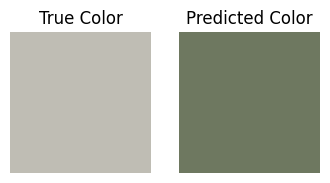

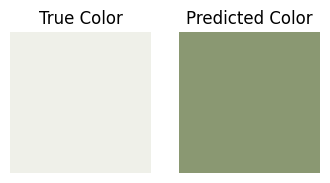

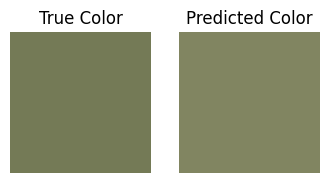

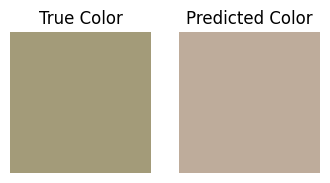

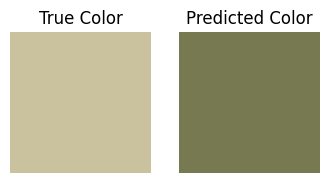

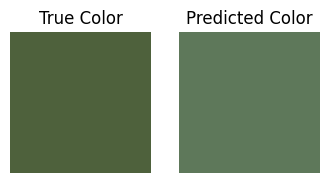

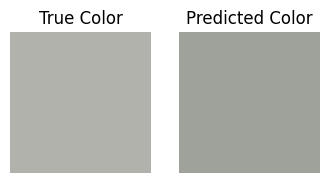

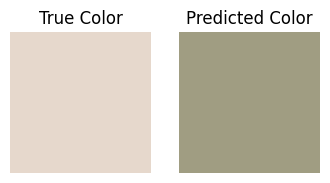

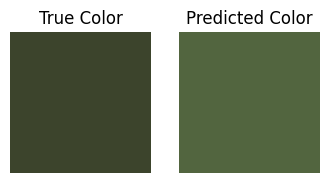

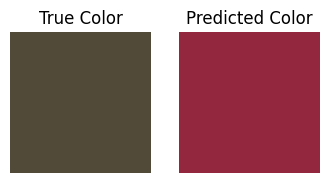

In [69]:
evaluate_model_with_accuracy(model, test_loader, criterion, threshold=0.2)
visualize_predictions(model, test_loader, num_samples=10)

